## **0. 루브릭**

| 평가문항 | 세부기준 |
| --- | --- |
| 1. U-Net을 통한 세그멘테이션 작업이 정상적으로 진행되었는가? | KITTI 데이터셋 구성, U-Net 모델 훈련, 결과를 시각화한 한 사이클이 정상 수행되어 세그멘테이션 결과 이미지를 제출하였다. |
| 2. U-Net++ 모델이 성공적으로 구현되었는가? | U-Net++ 모델을 스스로 구현하여 학습진행 후 세그멘테이션 결과까지 정상 진행되었다. |
| 3. U-Net과 U-Net++ 두 모델의 성능이 정량적/정성적으로 비교되었는가? | U-Net++ 외 세그멘테이션 결과 사진과 IoU 계산치를 U-Net과 비교하여 우열함을 확인하였다. |


In [ ]:
# google drive 마운트하기
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **1. 실험하기**

바로 U-Net++ 모델을 스스로의 힘으로 직접 구현해 보고, U-Net을 활용했던 도로 세그멘테이션 태스크에 적용하여 U-Net을 썼을 때보다 성능이 향상되었음을 확인해 봅시다.

정성적으로는 두 모델의 세그멘테이션 결과를 시각화해서 비교해 볼 수 있을 것이고, 정량적으로는 동일 이미지에 대한 IoU 값을 비교해 보면 됩니다.

### **Step 1. KITTI 데이터셋 수집과 구축**

다운로드한 KITTI 데이터에 data augmentation을 적용한 형태로 데이터셋을 구축합니다.

U-Net++는 메모리 사용량이 U-Net보다 꽤 많아집니다. 그러니 배치 사이즈를 적절히 줄여서 설정하시기를 권합니다.

In [ ]:
# 필요한 라이브러리 불러오기
import os
import math
import numpy as np
import tensorflow as tf

from PIL import Image
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from glob import glob

from tensorflow.keras.models import *
from tensorflow.keras.layers import *
from tensorflow.keras.optimizers import *

from albumentations import  HorizontalFlip
from albumentations import RandomSizedCrop
from albumentations import Compose
from albumentations import OneOf
from albumentations import Resize

In [ ]:
# 이미지 데이터셋 경로 설정하기
dir_path = '/content/drive/MyDrive/07. GoData/07.  Semantic Segmentation'

In [ ]:
# 훈련, 테스트 경로 설정하기
train_path = os.path.join(dir_path, 'train')
test_path = os.path.join(dir_path, 'test')

In [ ]:
# augementation build 함수 구현하기
def build_augmentation(is_train=True):
  if is_train:    # 훈련용 데이터일 경우
    return Compose([
                    HorizontalFlip(p=0.5),    # 50%의 확률로 좌우대칭하기
                    RandomSizedCrop(         # 50%의 확률로 RandomSizedCrop
                        min_max_height=(300, 370),
                        w2h_ratio=370/1242,
                        height=224,
                        width=224,
                        p=0.5
                        ),
                    Resize(              # 입력 이미지를 224X224로 resize하기
                        width=224,
                        height=224
                        )
                    ])
  return Compose([      # 테스트용 데이터일 경우에는
                        # 224X224로 resize만 수행하기
                Resize(
                    width=224,
                    height=224
                    )
                ])

### **Step 1. KITTI 데이터셋 수집과 구축**

다운로드한 KITTI 데이터에 data augmentation을 적용한 형태로 데이터셋을 구축합니다.

U-Net++는 메모리 사용량이 U-Net보다 꽤 많아지므로 배치 사이즈를 적절히 줄여서 설정하시기를 권합니다.

In [ ]:
# 훈련 이미지에는 augmentation 적용하기
augmentation_train = build_augmentation()

# 테스트 이미지에는 augmentation 적용하지 않기
augmentation_test = build_augmentation(is_train=False)

In [ ]:
# input_image 경로 설정하기
input_images = glob(os.path.join(train_path, 'images' ,"*.png"))

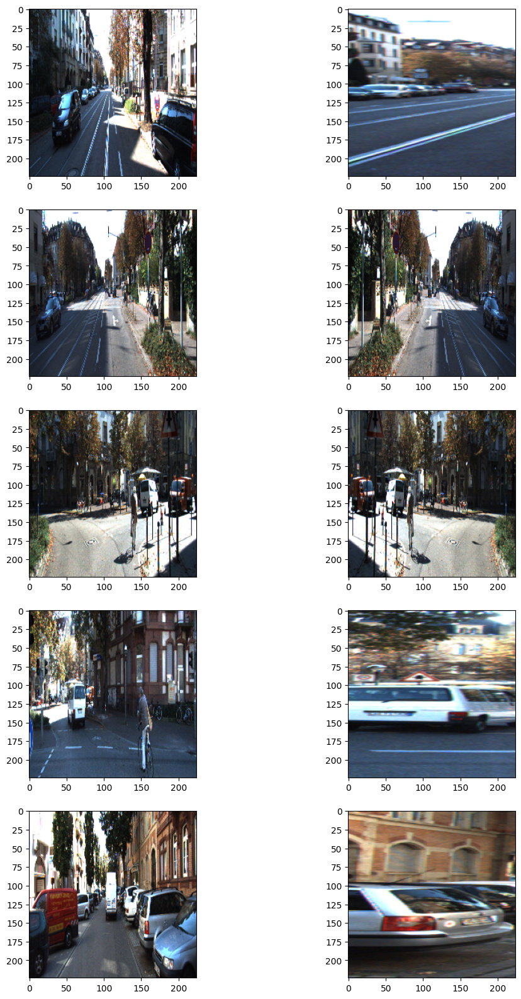

In [ ]:
# 훈련 데이터셋에서 5개만 가져와서
# augmentation을 적용해 보기
plt.figure(figsize=(12, 20))

for i in range(5):
    image = imread(input_images[i])
    image_data = {"image":image}
    resized = augmentation_test(**image_data)
    processed = augmentation_train(**image_data)
    plt.subplot(5, 2, 2*i+1)
    plt.imshow(resized["image"])  # 왼쪽이 원본 이미지
    plt.subplot(5, 2, 2*i+2)
    plt.imshow(processed["image"])  # 오른쪽이 augment된 이미지

plt.show()

In [ ]:
class KittiGenerator(tf.keras.utils.Sequence):
  '''
  KittiGenerator는 tf.keras.utils.Sequence를 상속받습니다.
  우리가 KittiDataset을 원하는 방식으로 preprocess하기 위해서 Sequnce를 커스텀해 사용합니다.
  '''
  def __init__(self,
               dir_path,
               batch_size=16,
               img_size=(224, 224, 3),
               output_size=(224, 224),
               is_train=True,
               augmentation=None):
    '''
    dir_path: dataset의 directory path입니다.
    batch_size: batch_size입니다.
    img_size: preprocess에 사용할 입력이미지의 크기입니다.
    output_size: ground_truth를 만들어주기 위한 크기입니다.
    is_train: 이 Generator가 학습용인지 테스트용인지 구분합니다.
    augmentation: 적용하길 원하는 augmentation 함수를 인자로 받습니다.
    '''
    self.dir_path = dir_path
    self.batch_size = batch_size
    self.is_train = is_train
    self.dir_path = dir_path
    self.augmentation = augmentation
    self.img_size = img_size
    self.output_size = output_size

    # load_dataset()을 통해서 kitti dataset의 directory path에서
    # 라벨과 이미지를 확인합니다.
    self.data = self.load_dataset()

  def load_dataset(self):
    # kitti dataset에서 필요한 정보(이미지 경로 및 라벨)를
    # directory에서 확인하고 로드하는 함수
    # 이때 is_train에 따라 test set을 분리해서
    # load하도록 해야합니다.
    input_images = glob(os.path.join(self.dir_path, "images", "*.png"))
    label_images = glob(os.path.join(self.dir_path, "semantic", "*.png"))
    input_images.sort()
    label_images.sort()
    assert len(input_images) == len(label_images)
    data = [ _ for _ in zip(input_images, label_images)]

    if self.is_train:
      return data[:-30]
    return data[-30:]

  def __len__(self):
    # Generator의 length로서 전체 dataset을 batch_size로 나누고
    # 소숫점 첫째자리에서 올림한 값을 반환하기
    return math.ceil(len(self.data) / self.batch_size)

  def __getitem__(self, index):
    # 입력과 출력을 만들기
    # 입력은 resize및 augmentation이 적용된 input image이고
    # 출력은 semantic label
    batch_data = self.data[
                           index*self.batch_size:
                           (index + 1)*self.batch_size
                           ]
    inputs = np.zeros([self.batch_size, *self.img_size])
    outputs = np.zeros([self.batch_size, *self.output_size])

    for i, data in enumerate(batch_data):
      input_img_path, output_path = data
      _input = imread(input_img_path)
      _output = imread(output_path)
      _output = (_output==7).astype(np.uint8)*1
      data = {
          "image": _input,
          "mask": _output,
          }
      augmented = self.augmentation(**data)
      inputs[i] = augmented["image"]/255
      outputs[i] = augmented["mask"]
      return inputs, outputs

  def on_epoch_end(self):
    # 한 epoch가 끝나면 실행되는 함수
    # 학습 중인 경우에 순서를 random shuffle하도록 적용한 것을 볼 수 있음
    self.indexes = np.arange(len(self.data))
    if self.is_train == True :
      np.random.shuffle(self.indexes)
      return self.indexes

In [ ]:
# barch_size 설정하기
batch_size = 8

In [ ]:
# 훈련 이미지 데이터셋 구성하기
train_generator = KittiGenerator(
    train_path,
    batch_size=batch_size,
    augmentation=augmentation_train,
    is_train=True
)

In [ ]:
# 테스트 이미지 데이터셋 구성하기
test_generator = KittiGenerator(
    train_path,
    batch_size=batch_size,
    augmentation=augmentation_test,
    is_train=False
)

In [ ]:
def conv_block(dim, x, concat_list=[], to_up_concat=False, to_pool=False):
    if to_up_concat:
        x = Conv2DTranspose(dim, 2, activation='relu', strides=(2,2),
                            kernel_initializer='he_normal')(x)  # Up Sampling
        concat_list.append(x)
        x = concatenate(concat_list, axis = 3)  # Skip Connection

    x = Conv2D(dim, 3, activation='elu', padding='same',
               kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)  # x = Dropout(0.5)(x)
    x = Conv2D(dim, 3, activation='elu', padding='same',
               kernel_initializer='he_normal')(x)
    x = BatchNormalization()(x)  # x = Dropout(0.5)(x)

    if to_pool:
        x = MaxPooling2D(pool_size=(2, 2))(x)  # Down Sampling

    return x

In [ ]:
def get_model_outputs(x):
    x = Conv2D(2, 3, activation='relu', padding='same',
               kernel_initializer='he_normal')(x)
    x = Conv2D(1, 1, activation='sigmoid')(x)

    return x

In [ ]:
# U-Net을 만드는 함수 구현하기
def build_unet(input_shape=(224, 224, 3)):
    inputs = Input(input_shape)

    filter_list = [64,128,256,512,1024]

    # Contracting Path (Left)
    conv1 = conv_block(filter_list[0], inputs)
    conv2 = conv_block(filter_list[1], conv1, to_pool=True)
    conv3 = conv_block(filter_list[2], conv2, to_pool=True)
    conv4 = conv_block(filter_list[3], conv3, to_pool=True)

    conv5 = conv_block(filter_list[4], conv4, to_pool=True)  # (Middle)

    # Expanding Path (Right)
    conv6 = conv_block(filter_list[3], conv5, [conv4], to_up_concat=True)
    conv7 = conv_block(filter_list[2], conv6, [conv3], to_up_concat=True)
    conv8 = conv_block(filter_list[1], conv7, [conv2], to_up_concat=True)
    conv9 = conv_block(filter_list[0], conv8, [conv1], to_up_concat=True)

    outputs = get_model_outputs(conv9)

    # U-Net 생성
    model = Model(inputs = inputs, outputs = outputs)
    return model

In [ ]:
# U-Net 모델 생성하기
U_Net = build_unet()

In [ ]:
# U-Net 모델 구조 확인하기
U_Net.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 224, 224, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 batch_normalization (Batch  (None, 224, 224, 64)         256       ['conv2d[0][0]']              
 Normalization)                                                                                   
                                                                                                  
 conv2d_1 (Conv2D)           (None, 224, 224, 64)         36928     ['batch_normalization[0][0

In [ ]:
# 학습 횟수 설정하기
epochs = 500

In [ ]:
# U-Net 모델 컴파일하기
U_Net.compile(optimizer=Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=['accuracy'])

In [ ]:
# U-Net 모델 학습하기
U_Net_history = U_Net.fit(train_generator,
                    epochs=epochs,
                    steps_per_epoch=len(train_generator),
                    validation_data=test_generator,
                    validation_steps=len(test_generator)
)

Epoch 1/500
22/22 [==============================] - 76s 1s/step - loss: 0.7306 - accuracy: 0.6832 - val_loss: 0.7220 - val_accuracy: 0.6021
Epoch 2/500
22/22 [==============================] - 14s 652ms/step - loss: 0.5530 - accuracy: 0.8345 - val_loss: 0.6919 - val_accuracy: 0.7528
Epoch 3/500
22/22 [==============================] - 15s 677ms/step - loss: 0.4195 - accuracy: 0.9120 - val_loss: 0.6850 - val_accuracy: 0.6428
Epoch 4/500
22/22 [==============================] - 15s 682ms/step - loss: 0.3577 - accuracy: 0.9354 - val_loss: 0.6540 - val_accuracy: 0.7639
Epoch 5/500
22/22 [==============================] - 15s 665ms/step - loss: 0.3025 - accuracy: 0.9554 - val_loss: 0.6658 - val_accuracy: 0.7128
Epoch 6/500
22/22 [==============================] - 15s 672ms/step - loss: 0.2794 - accuracy: 0.9573 - val_loss: 0.6436 - val_accuracy: 0.8256
Epoch 7/500
22/22 [==============================] - 15s 673ms/step - loss: 0.2673 - accuracy: 0.9648 - val_loss: 0.6735 - val_accuracy: 0.

In [ ]:
# U-Net 모델 학습 결과 시각화하는 함수 구현하기
def draw_U_Net_history(U_Net_history, model_name='U-Net'):
   plt.figure(figsize=(12, 4))

   # Loss, Val_Loss 시각화하기
   plt.subplot(1, 2, 1)
   plt.plot(U_Net_history.history['loss'], label='loss')
   plt.plot(U_Net_history.history['val_loss'], label='val_loss')
   plt.title('U-Net Loss')
   plt.ylabel('Loss')
   plt.xlabel('Epoch')
   plt.legend(['loss', 'val_loss'], loc='upper left')

   # Accuracy, Val_Accuracy 시각화하기
   plt.subplot(1, 2, 2)
   plt.plot(U_Net_history.history['accuracy'], label='accuracy')
   plt.plot(U_Net_history.history['val_accuracy'], label='val_accuracy')
   plt.title('U-Net Accuracy')
   plt.ylabel('Accuracy')
   plt.xlabel('Epoch')
   plt.legend(['accuracy', 'val_accuracy'], loc='lower right')

   plt.tight_layout()
   plt.show()

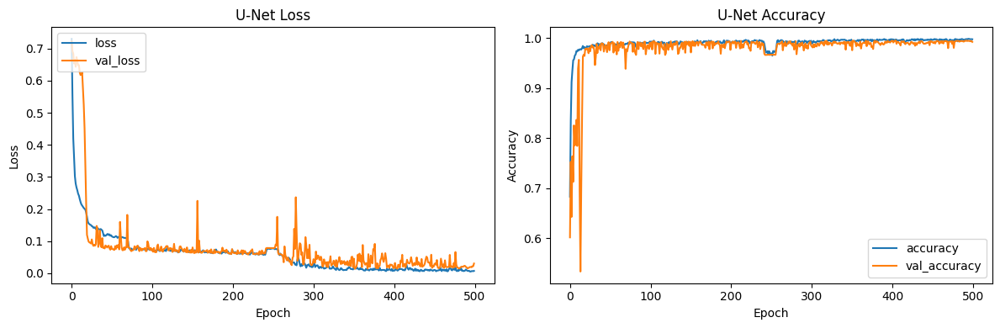

In [ ]:
# U-Net 모델 학습 결과 시각화하기
draw_U_Net_history(U_Net_history, 'U-Net')

1. **U-Net Loss**
* 초기 단계: 훈련 손실과 검증 손실 모두 높게 시작합니다.
* 초기 몇 에포크: 훈련 손실과 검증 손실이 빠르게 감소하며 효과적인 학습을 나타냅니다.
* 안정화: 약 50 에포크 후 훈련 손실이 안정화되며 점차 감소합니다.
* 검증 손실 변동성: 검증 손실은 변동성이 더 크며, 가끔 스파이크가 발생하여 과적합 또는 검증 데이터의 변동을 나타냅니다.

2. **U-Net Accuracy**
* 초기 단계: 훈련 정확도와 검증 정확도 모두 낮게 시작합니다.
* 초기 몇 에포크: 훈련 정확도와 검증 정확도가 빠르게 증가합니다.
* 안정화: 약 50 에포크 후 훈련 정확도와 검증 정확도 모두 높은 값(거의 100%)으로 안정화됩니다.
* 검증 정확도 변동성: 검증 정확도는 변동성이 더 크며, 가끔 떨어지는 경우가 있어 검증 성능의 변동을 나타냅니다.

In [ ]:
# U-Net 모델 저장하기
U_Net_path = os.path.join(train_path, 'U-Net.h5')
U_Net.save(U_Net_path)   # 학습한 모델을 저장하기

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### **Step 2. U-Net++ 모델의 구현**

U-Net의 모델 구조와 소스코드를 면밀히 비교해 보다 보면, U-Net++를 어떻게 구현할 수 있을지에 대한 방안을 떠올릴 수 있을 것입니다.

그 외 적절히 U-Net의 백본 구조, 기타 파라미터 변경 등을 통해 추가적인 성능 향상이 가능할 수도 있습니다.

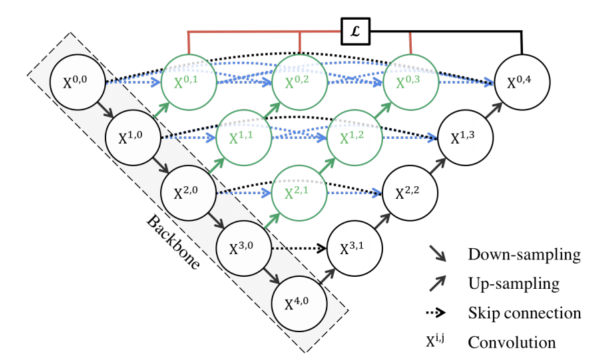

In [ ]:
# U-Net++을 만드는 함수 구현하기
def build_U_Net_Plus(input_shape=(224, 224, 3), deep_supervision=True):
    inputs = Input(input_shape)

    filter_list = [64,128,256,512,1024]

    x_00 = conv_block(filter_list[0], inputs)
    x_10 = conv_block(filter_list[1], x_00, to_pool=True)
    x_20 = conv_block(filter_list[2], x_10, to_pool=True)
    x_30 = conv_block(filter_list[3], x_20, to_pool=True)
    x_40 = conv_block(filter_list[4], x_30, to_pool=True)

    x_01 = conv_block(filter_list[0], x_10, [x_00], to_up_concat=True)
    x_11 = conv_block(filter_list[1], x_20, [x_10], to_up_concat=True)
    x_21 = conv_block(filter_list[2], x_30, [x_20], to_up_concat=True)

    x_02 = conv_block(filter_list[0], x_11, [x_00,x_01], to_up_concat=True)
    x_12 = conv_block(filter_list[1], x_21, [x_10,x_11], to_up_concat=True)

    x_03 = conv_block(filter_list[0], x_12, [x_00,x_01,x_02], to_up_concat=True)

    x_31 = conv_block(filter_list[3], x_40, [x_30], to_up_concat=True)
    x_22 = conv_block(filter_list[2], x_31, [x_20], to_up_concat=True)
    x_13 = conv_block(filter_list[1], x_22, [x_10], to_up_concat=True)
    x_04 = conv_block(filter_list[0], x_13, [x_00,x_01,x_02,x_03], to_up_concat=True)

    if deep_supervision:
        x_01_outputs = get_model_outputs(x_01)
        x_02_outputs = get_model_outputs(x_02)
        x_03_outputs = get_model_outputs(x_03)
        x_04_outputs = get_model_outputs(x_04)

        outputs_list = [x_01_outputs, x_02_outputs, x_03_outputs, x_04_outputs]
        # 레이어 모든 값 평균 계산하기
        outputs = tf.keras.layers.Average()(outputs_list)
    else:
        outputs = get_model_outputs(x_04)

    # U-Net++ 생성하기
    model = Model(inputs = inputs, outputs = outputs)
    return model

In [ ]:
# U-Net++ 모델 생성하기
U_Net_Plus = build_U_Net_Plus()

In [ ]:
# U-Net++ 모델 구조 확인하기
U_Net_Plus.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_2 (InputLayer)        [(None, 224, 224, 3)]        0         []                            
                                                                                                  
 conv2d_20 (Conv2D)          (None, 224, 224, 64)         1792      ['input_2[0][0]']             
                                                                                                  
 batch_normalization_18 (Ba  (None, 224, 224, 64)         256       ['conv2d_20[0][0]']           
 tchNormalization)                                                                                
                                                                                                  
 conv2d_21 (Conv2D)          (None, 224, 224, 64)         36928     ['batch_normalization_18

또 한 가지 주의해야 할 점은 Loss를 조금 다르게 구현해야 한다는 점입니다.

**binary cross-entropy**와 **dice coefficient**를 사용해야 합니다.

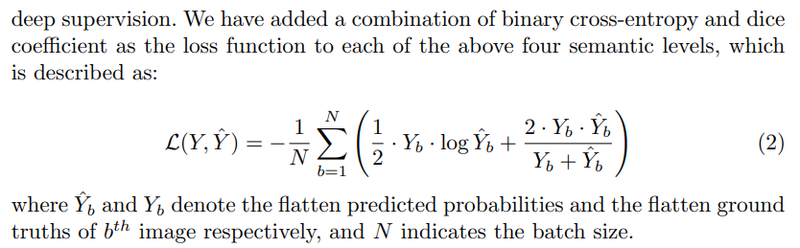

In [ ]:
from keras import backend as K

# Loss를 다르게 구현하기 (dice coefficient을 사용해야 함, U-Net++ 전용)
def dice_coef(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

def dice_coef_loss(y_true, y_pred):
    return 1. - dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    return 0.5 * keras.losses.binary_crossentropy(y_true, y_pred) - dice_coef(y_true, y_pred)

In [ ]:
# U-Net++ 모델 컴파일하기
U_Net_Plus.compile(optimizer=Adam(learning_rate=1e-4),
              loss='binary_crossentropy',
              metrics=[dice_coef])

In [ ]:
# U-Net++ 모델 학습하기
U_Net_Plus_history = U_Net_Plus.fit(train_generator,
                    epochs=epochs,
                    steps_per_epoch=len(train_generator),
                    validation_data=test_generator,
                    validation_steps=len(test_generator)
)

Epoch 1/500
22/22 [==============================] - 65s 1s/step - loss: 0.2981 - dice_coef: 0.1046 - val_loss: 0.4557 - val_dice_coef: 0.0609
Epoch 2/500
22/22 [==============================] - 28s 1s/step - loss: 0.1890 - dice_coef: 0.1419 - val_loss: 0.3336 - val_dice_coef: 0.0651
Epoch 3/500
22/22 [==============================] - 28s 1s/step - loss: 0.1553 - dice_coef: 0.1572 - val_loss: 0.2970 - val_dice_coef: 0.0629
Epoch 4/500
22/22 [==============================] - 29s 1s/step - loss: 0.1368 - dice_coef: 0.1645 - val_loss: 0.2743 - val_dice_coef: 0.0603
Epoch 5/500
22/22 [==============================] - 28s 1s/step - loss: 0.1215 - dice_coef: 0.1742 - val_loss: 0.2723 - val_dice_coef: 0.0579
Epoch 6/500
22/22 [==============================] - 29s 1s/step - loss: 0.1172 - dice_coef: 0.1598 - val_loss: 0.2704 - val_dice_coef: 0.0587
Epoch 7/500
22/22 [==============================] - 29s 1s/step - loss: 0.1122 - dice_coef: 0.2081 - val_loss: 0.2644 - val_dice_coef: 0.0575

In [ ]:
# U-Net++ 모델 학습 결과 시각화하는 함수 구현하기
def draw_U_Net_Plus_history(U_Net_Plus_history, model_name='U-Net++'):
   plt.figure(figsize=(12, 4))

   # Loss, Val_Loss 시각화하기
   plt.subplot(1, 2, 1)
   plt.plot(U_Net_Plus_history.history['loss'], label='loss')
   plt.plot(U_Net_Plus_history.history['val_loss'], label='val_loss')
   plt.title('U-Net++ Loss')
   plt.ylabel('Loss')
   plt.xlabel('Epoch')
   plt.legend(['loss', 'val_loss'], loc='upper left')

   # dice_coef, val_dice_coef 시각화하기
   plt.subplot(1, 2, 2)
   plt.plot(U_Net_Plus_history.history['dice_coef'], label='dice_coef')
   plt.plot(U_Net_Plus_history.history['val_dice_coef'], label='val_dice_coef')
   plt.title(f'{model_name} Dice Coef')
   plt.ylabel(f'{model_name} Dice Coef')
   plt.xlabel('Epoch')
   plt.legend(['dice_coef', 'val_dice_coef'], loc='upper left')

   plt.tight_layout()
   plt.show()

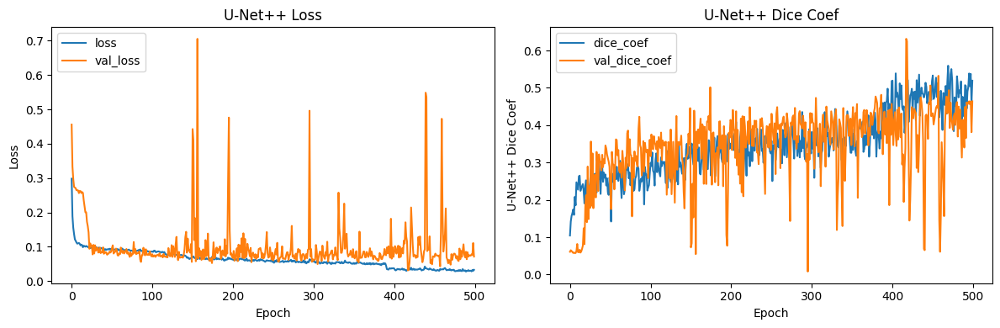

In [ ]:
# U-Net++ 모델 학습 결과 시각화하기
draw_U_Net_Plus_history(U_Net_Plus_history)

1. **U-Net++ Loss**
* 초기 단계: 훈련 손실과 검증 손실이 모두 높은 상태에서 시작합니다.
* 초기 몇 에포크: 훈련 손실과 검증 손실이 빠르게 감소하여 효과적인 학습을 나타냅니다.
* 안정화: 약 50 에포크 후 훈련 손실은 안정화되며 낮은 값을 유지합니다.
* 검증 손실 변동성: 검증 손실은 큰 변동성을 보이며, 주기적으로 급격히 상승하는 스파이크가 나타납니다. 이는 모델이 과적합될 가능성을 시사합니다.

2. **U-Net++ Dice Coefficient**
* 초기 단계: 훈련 Dice Coefficient와 검증 Dice Coefficient가 낮은 값에서 시작합니다.
* 초기 몇 에포크: 훈련과 검증 Dice Coefficient가 빠르게 상승하여 모델의 예측 성능이 향상됨을 나타냅니다.
* 안정화: 약 100 에포크 후 두 Coefficient 모두 점차 안정화되지만, 여전히 변동성을 보입니다.
* 검증 Dice Coefficient 변동성: 검증 Dice Coefficient는 훈련 Dice Coefficient에 비해 더 큰 변동성을 보이며, 주기적으로 급격히 하락하는 경우가 있습니다.

In [ ]:
# U-Net++ 모델 저장하기
U_Net_Plus_path = os.path.join(train_path, 'U-Net++.h5')
U_Net_Plus.save(U_Net_Plus_path)   # 학습한 모델을 저장하기

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### **Step 3. U-Net 과 U-Net++ 모델이 수행한 세그멘테이션 결과 분석**

두 모델의 정량적, 정성적 성능을 비교해 봅시다.

In [ ]:
# IoU 점수 계산하는 함수 구현하기
def calculate_iou_score(target, prediction):
    intersection = np.logical_and(target, prediction)
    union = np.logical_or(target, prediction)
    iou_score = float(np.sum(intersection)) / float(np.sum(union))
    print('IoU : %f' % iou_score )
    return iou_score

In [ ]:
# get_output 함수 구현하기
def get_output(model, preproc, image_path, output_path_dict,
               label_path, to_visualize=False):

    origin_img = imread(image_path)
    data = {"image":origin_img}
    processed = preproc(**data)
    output = model(np.expand_dims(processed["image"]/255,axis=0))
    # 0.5라는 threshold를 변경하면 도로 인식 결과 범위가 달라짐
    output = (output[0].numpy()>=0.5).astype(np.uint8).squeeze(-1)*255
    prediction = output/255   # 도로로 판단한 영역

    output_detect = Image.fromarray(output)
    output_detect = output_detect.resize((origin_img.shape[1],
                                          origin_img.shape[0])).convert('RGBA')
    # 저장하기 # 도로 detection
    output_detect.save(output_path_dict['detect'], 'png')

    background = Image.fromarray(origin_img).convert('RGBA')
    output_blend = Image.blend(background, output_detect, alpha=0.5)
    # 저장하기 # 도로 detection + 원본 이미지
    output_blend.save(output_path_dict['blend'], 'png')

    if to_visualize:
        # 시각화하고, 저장하기
        plt.figure(figsize=(12,6))

        plt.subplot(211)
        plt.title('Detection')
        plt.axis('off')
        plt.imshow(output_detect)

        plt.subplot(212)
        plt.title('Blend')
        plt.axis('off')
        plt.imshow(output_blend)

        plt.tight_layout()
        # 저장하기 # 이미지 2개 같이 저장하기
        plt.savefig(output_path_dict['all'])  # 저장 # 이미지 2개 같이 저장
        plt.show()

    if label_path:
        label_img = imread(label_path)
        label_data = {"image":label_img}
        label_processed = preproc(**label_data)
        label_processed = label_processed["image"]
        # 라벨에서 도로(7)로 기재된 영역
        target = (label_processed == 7).astype(np.uint8)*1

        return output, prediction, target
    else:
        return output, prediction, _

In [ ]:
# U-Net 모델 불러오기
U_Net = tf.keras.models.load_model(U_Net_path)

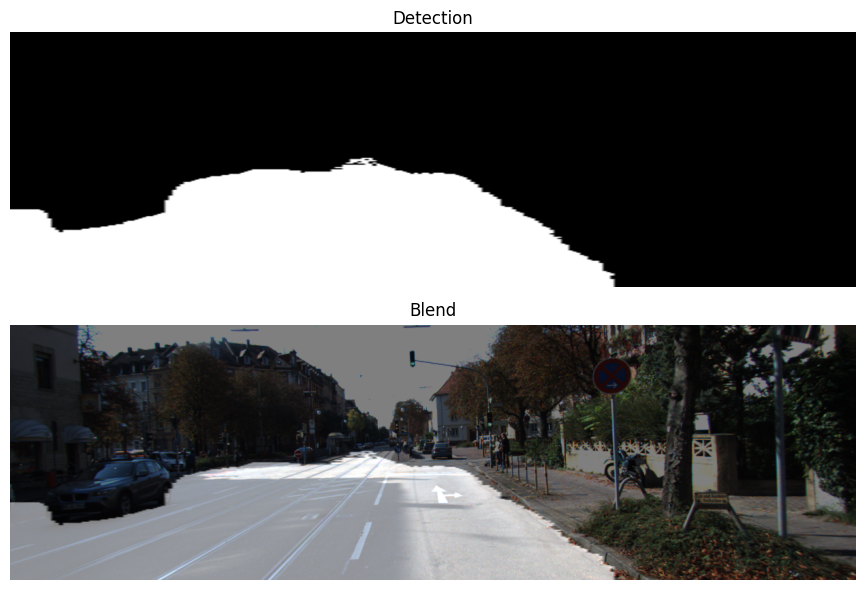

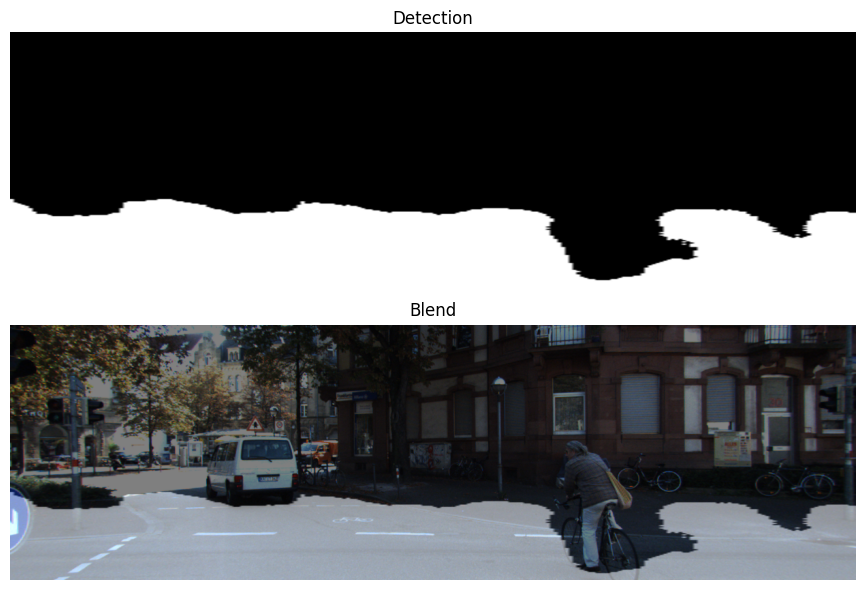

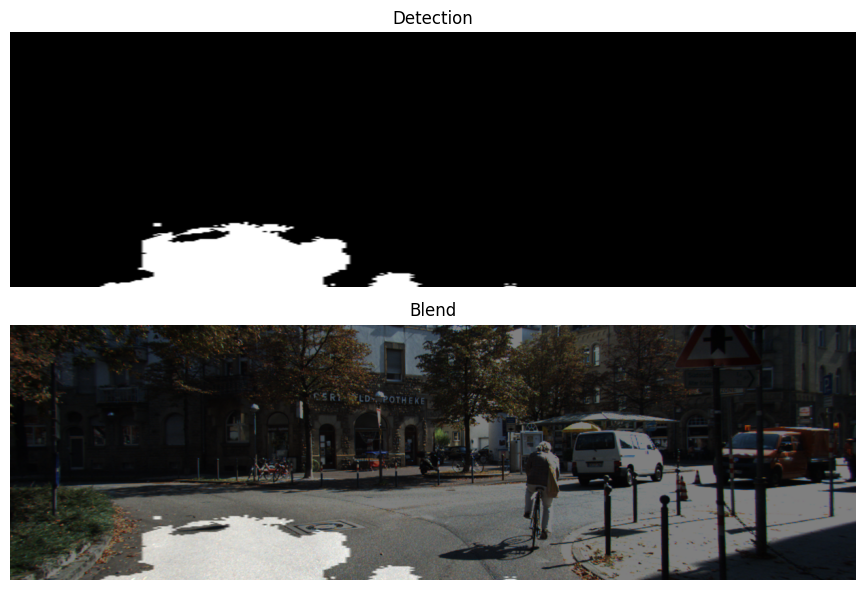

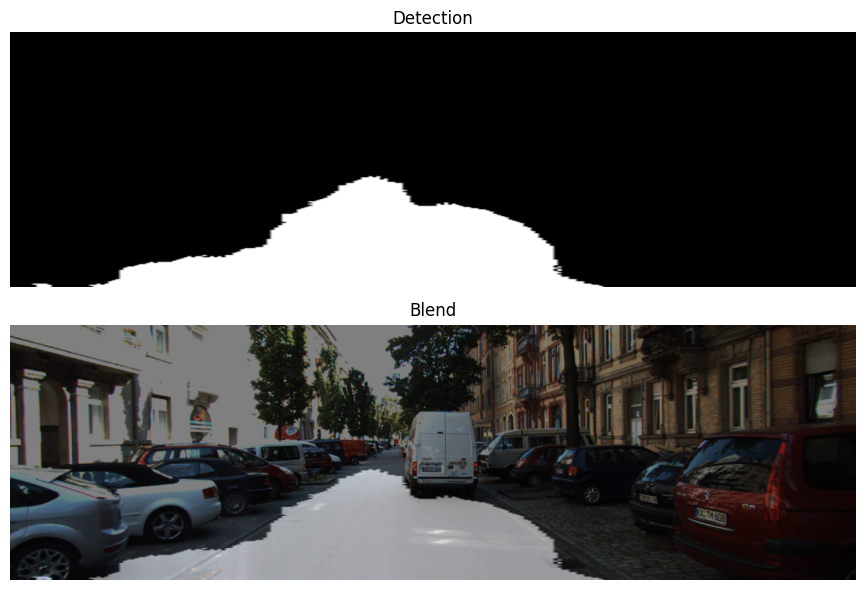

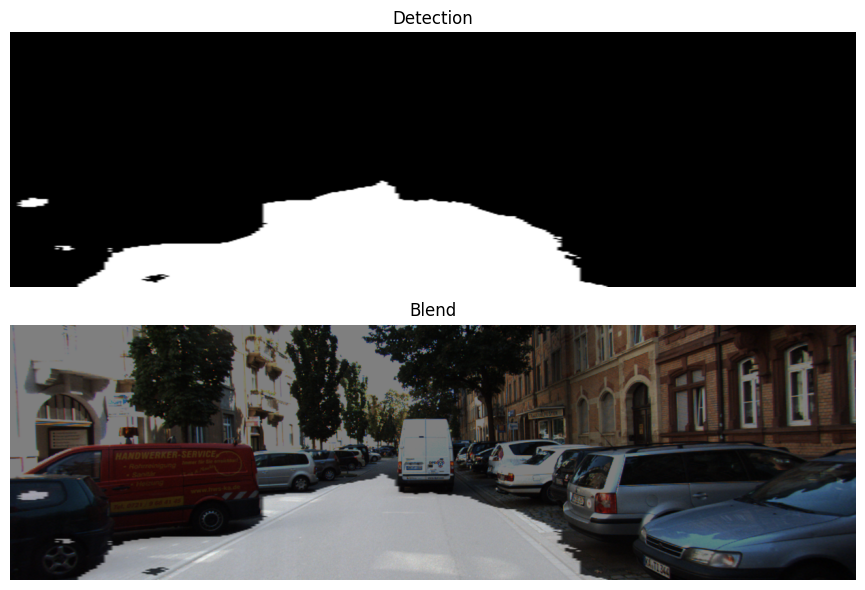

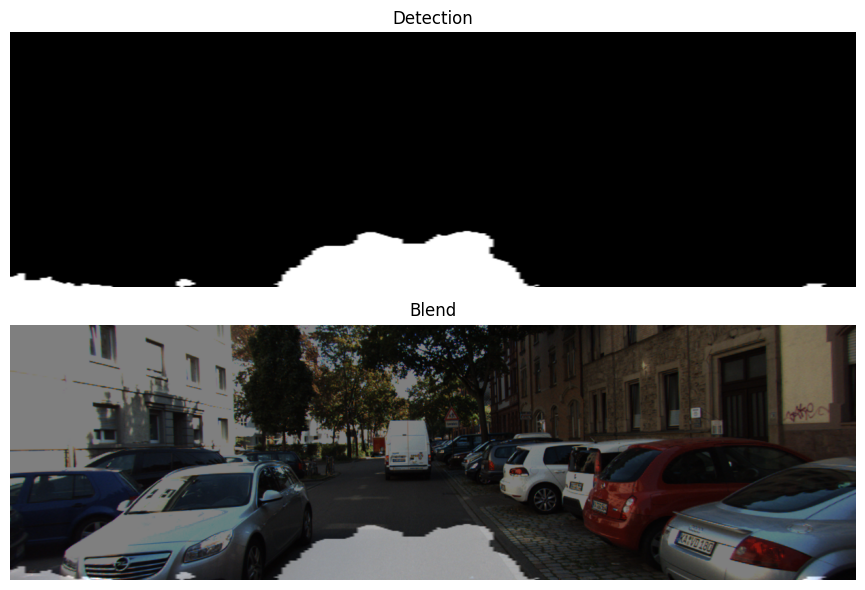

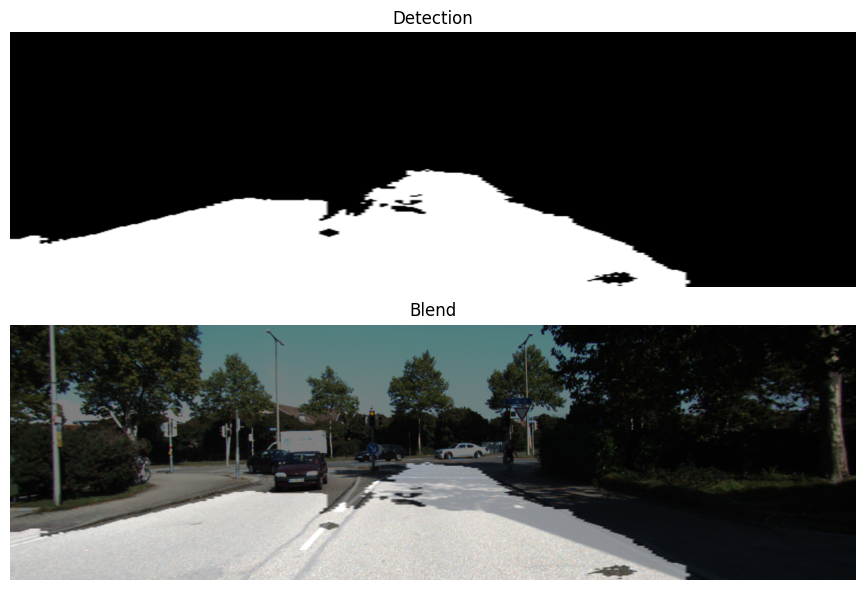

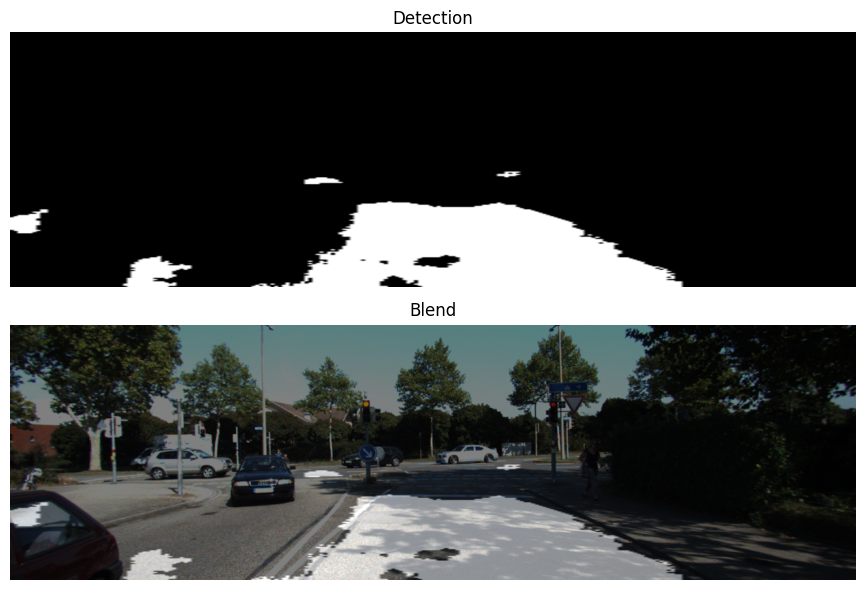

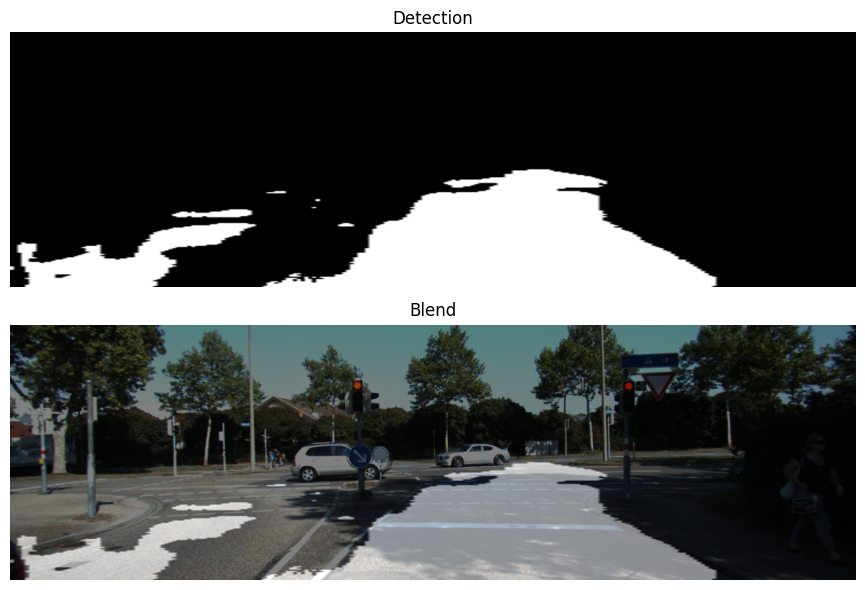

In [ ]:
# U-Net 모델 추론 결과 시각화하기
for i in range(1, 9):    # 첫 10개만 시각화하기
    output_U_Net, prediction_U_Net, target_U_Net = get_output(
        U_Net,
        augmentation_test,
        image_path=train_path + f'/images/00{str(i).zfill(4)}_10.png',
        output_path_dict={
            'detect': train_path + f'/U-Net/U-Net_result_{str(i).zfill(3)}_detect.png',
            'blend': train_path + f'/U-Net/U-Net_result_{str(i).zfill(3)}_blend.png',
            'all': train_path + f'/U-Net/U-Net_result_{str(i).zfill(3)}_all.png',
        },
        label_path=train_path + f'/semantic/00{str(i).zfill(4)}_10.png',
        to_visualize=True,
    )

In [ ]:
# U-Net 모델IoU 계산 결과 출력하기
U_Net_IoU = calculate_iou_score(target_U_Net, prediction_U_Net)
U_Net_IoU

IoU : 0.951057


0.9510570742662433

In [ ]:
# U-Net++ 모델 불러오기
U_Net_Plus = tf.keras.models.load_model(U_Net_Plus_path,
                                        custom_objects={'dice_coef': dice_coef,
                                                        'dice_coef_loss': dice_coef_loss,
                                                        'bce_dice_loss': bce_dice_loss})

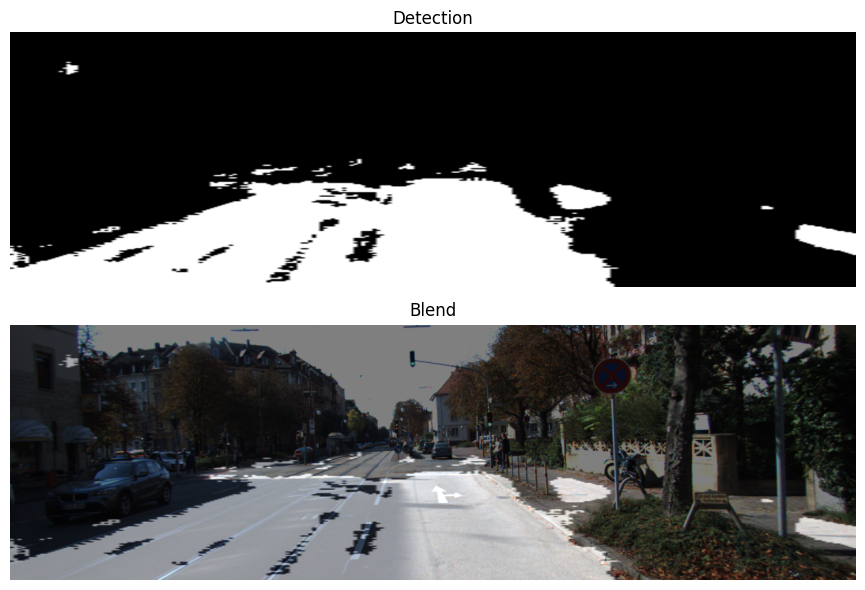

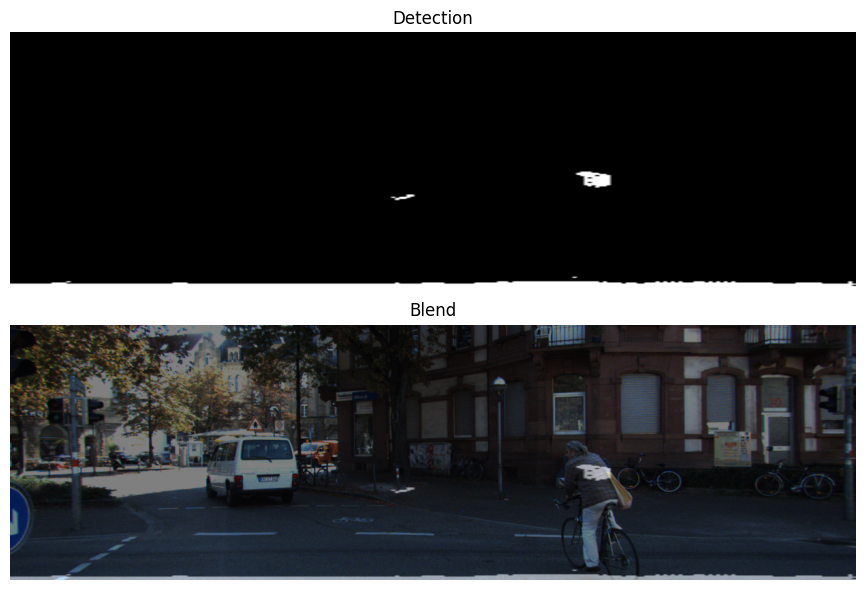

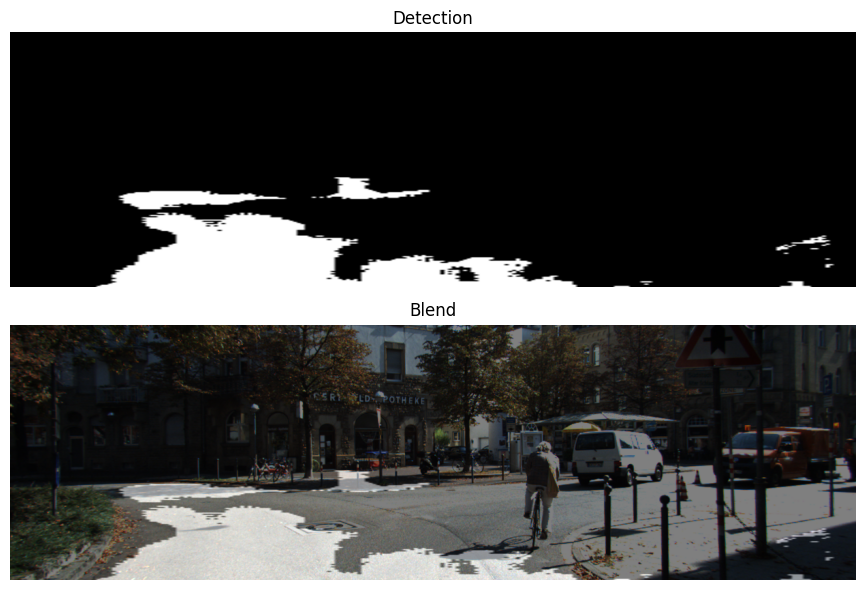

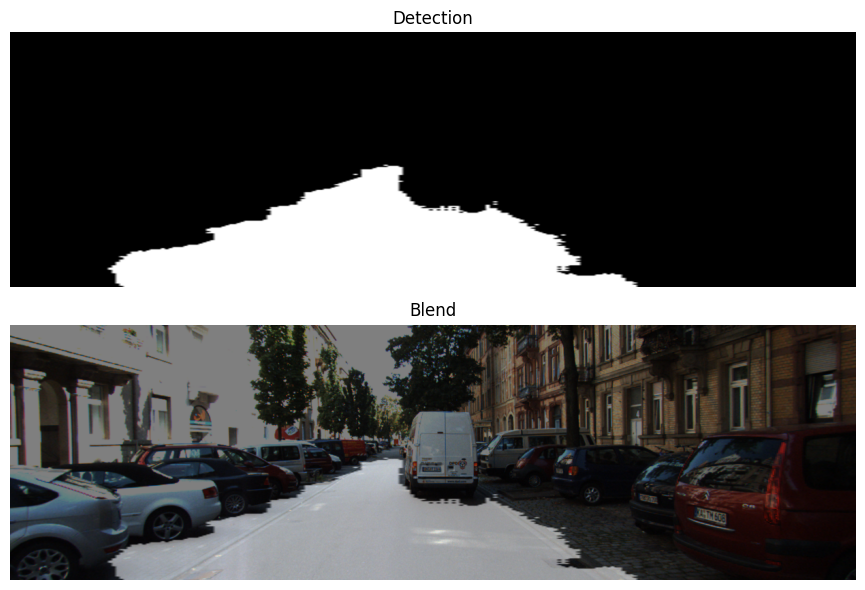

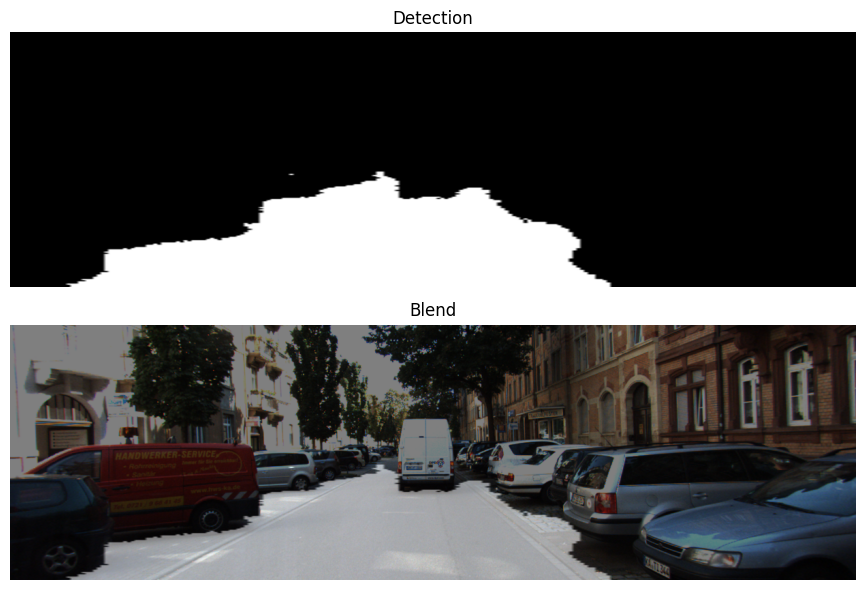

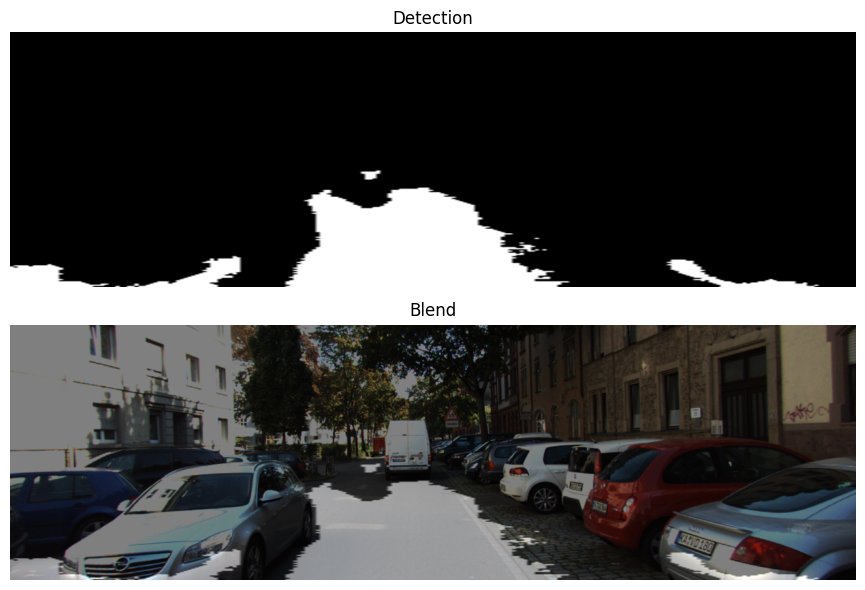

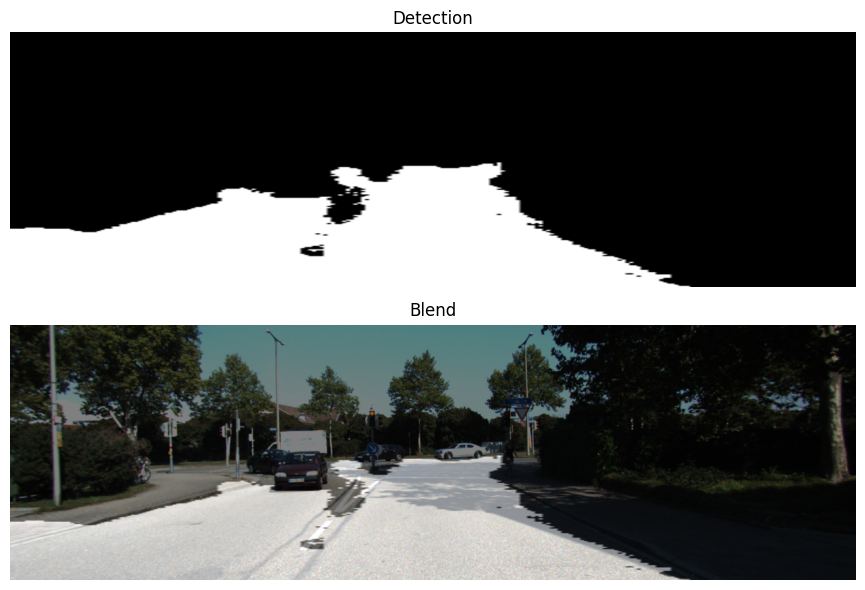

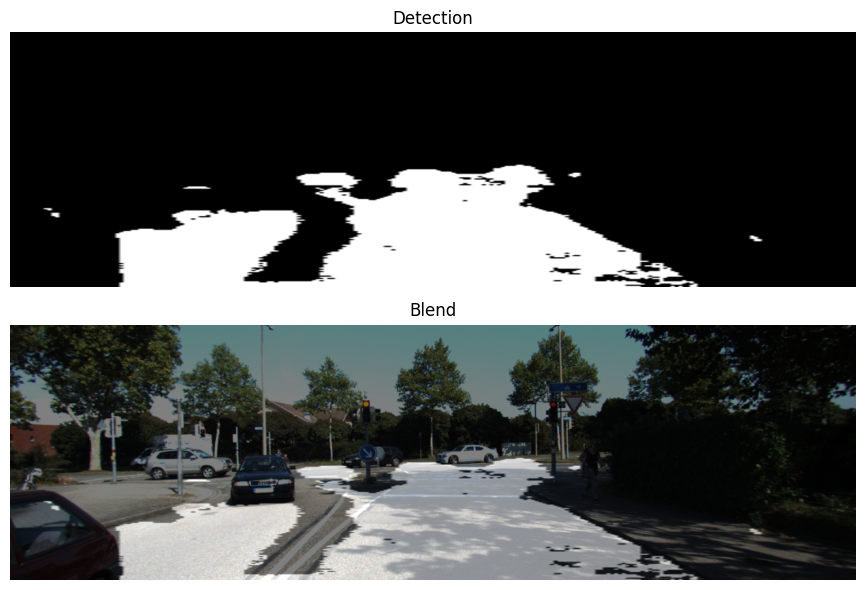

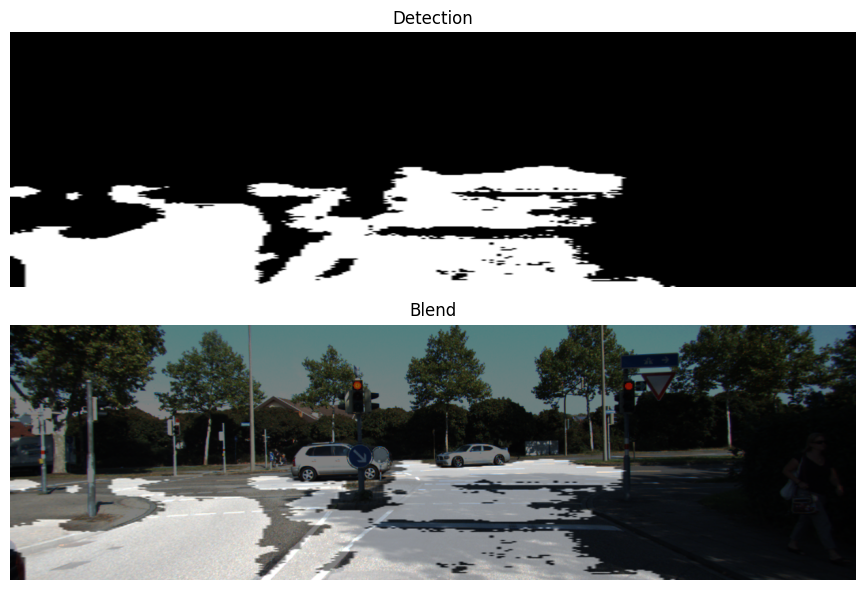

In [ ]:
# U-Net++ 모델 추론 결과 시각화하기
for i in range(1, 10):    # 첫 9개만 시각화하기
    output_U_Net_Plus, prediction_U_Net_Plus, target_U_Net_Plus = get_output(
        U_Net_Plus,
        augmentation_test,
        image_path=train_path + f'/images/00{str(i).zfill(4)}_10.png',
        output_path_dict={
            'detect': train_path + f'/U-Net++/U-Net++_result_{str(i).zfill(3)}_detect.png',
            'blend': train_path + f'/U-Net++/U-Net++_result_{str(i).zfill(3)}_blend.png',
            'all': train_path + f'/U-Net++/U-Net++_result_{str(i).zfill(3)}_all.png',
        },
        label_path=train_path + f'/semantic/00{str(i).zfill(4)}_10.png',
        to_visualize=True,
    )

In [ ]:
# U-Net++ 모델 IoU 계산 결과 출력하기
U_Net_Plus_IoU = calculate_iou_score(target_U_Net_Plus, prediction_U_Net_Plus)
U_Net_Plus_IoU

IoU : 0.730877


0.730876728449544

In [ ]:
# U-Net의 detect, blend, all 이미지 저장하기
for i in range(1, 200):
    output_U_Net, prediction_U_Net, target_U_Net = get_output(
        U_Net,
        augmentation_test,
        image_path=train_path + f'/images/00{str(i).zfill(4)}_10.png',
        output_path_dict={
            'detect': train_path + f'/U-Net/U-Net_result_{str(i).zfill(3)}_detect.png',
            'blend': train_path + f'/U-Net/U-Net_result_{str(i).zfill(3)}_blend.png',
            'all': train_path + f'/U-Net/U-Net_result_{str(i).zfill(3)}_all.png',
        },
        label_path=train_path + f'/semantic/00{str(i).zfill(4)}_10.png',
        to_visualize=False,
    )

In [ ]:
# U-Net++의 detect, blend, all 이미지 저장하기
for i in range(1, 200):
    output_U_Net_Plus, prediction_U_Net_Plus, target_U_Net_Plus = get_output(
        U_Net_Plus,
        augmentation_test,
        image_path=train_path + f'/images/00{str(i).zfill(4)}_10.png',
        output_path_dict={
            'detect': train_path + f'/U-Net++/U-Net++_result_{str(i).zfill(3)}_detect.png',
            'blend': train_path + f'/U-Net++/U-Net++_result_{str(i).zfill(3)}_blend.png',
            'all': train_path + f'/U-Net++/U-Net++_result_{str(i).zfill(3)}_all.png',
        },
        label_path=train_path + f'/semantic/00{str(i).zfill(4)}_10.png',
        to_visualize=False,
    )

In [ ]:
# 추론 결과 저장하기 및 IoU 계산하기
def visualize_inference_and_get_iou(model, model_name='U-Net', to_visualize=False):
    iou = {}

    for i in range(len(os.listdir(os.path.join(train_path, 'images')))):
        output_U_Net, prediction_U_Net, target_U_Net = get_output(
            model,
            augmentation_test,
            image_path=train_path + f'/images/00{str(i).zfill(4)}_10.png',
            output_path_dict={
                              'detect': train_path + f'/{model_name}/{model_name}_result_{str(i).zfill(3)}_detect.png',
                              'blend': train_path + f'/{model_name}/{model_name}_result_{str(i).zfill(3)}_blend.png',
                              'all': train_path + f'/{model_name}/{model_name}_result_{str(i).zfill(3)}_all.png',
                              },
            label_path=train_path + f'/semantic/00{str(i).zfill(4)}_10.png',
            to_visualize=to_visualize,
        )

        iou[f'00{str(i).zfill(4)}_10.png'] = calculate_iou_score(target_U_Net, prediction_U_Net)

    return iou

In [ ]:
# U-Net IoU 결과 딕셔너리로 변환하기
U_Net_IoU_dict = visualize_inference_and_get_iou(model=U_Net,
                                                 model_name='U-Net',
                                                 to_visualize=False)

IoU : 0.785942
IoU : 0.951057
IoU : 0.703704
IoU : 0.233647
IoU : 0.845947
IoU : 0.756116
IoU : 0.482851
IoU : 0.872551
IoU : 0.477962
IoU : 0.569500
IoU : 0.696046
IoU : 0.674688
IoU : 0.573610
IoU : 0.761513
IoU : 0.888230
IoU : 0.892732
IoU : 0.898133
IoU : 0.874947
IoU : 0.519248
IoU : 0.673918
IoU : 0.748476
IoU : 0.379334
IoU : 0.927021
IoU : 0.878025
IoU : 0.829070
IoU : 0.767535
IoU : 0.732522
IoU : 0.787808
IoU : 0.754456
IoU : 0.751662
IoU : 0.725349
IoU : 0.789843
IoU : 0.812790
IoU : 0.787828
IoU : 0.597078
IoU : 0.886332
IoU : 0.833687
IoU : 0.849925
IoU : 0.837474
IoU : 0.841195
IoU : 0.860492
IoU : 0.839539
IoU : 0.837018
IoU : 0.685266
IoU : 0.693035
IoU : 0.687503
IoU : 0.657826
IoU : 0.604880
IoU : 0.695704
IoU : 0.605067
IoU : 0.621169
IoU : 0.693510
IoU : 0.645982
IoU : 0.694463
IoU : 0.175627
IoU : 0.516431
IoU : 0.620319
IoU : 0.140477
IoU : 0.000665
IoU : 0.540708
IoU : 0.576740
IoU : 0.684368
IoU : 0.837408
IoU : 0.625000
IoU : 0.384895
IoU : 0.699666
IoU : 0.65

In [ ]:
# U-Net++ IoU 결과 딕셔너리로 변환하기
U_Net_Plus_IoU_dict = visualize_inference_and_get_iou(model=U_Net_Plus,
                                                      model_name='U-Net++',
                                                      to_visualize=False)

IoU : 0.301923
IoU : 0.730877
IoU : 0.065846
IoU : 0.400000
IoU : 0.770991
IoU : 0.724829
IoU : 0.676042
IoU : 0.872992
IoU : 0.786162
IoU : 0.672924
IoU : 0.633622
IoU : 0.673694
IoU : 0.574513
IoU : 0.908520
IoU : 0.852854
IoU : 0.884897
IoU : 0.906403
IoU : 0.904519
IoU : 0.696177
IoU : 0.791030
IoU : 0.803136
IoU : 0.481600
IoU : 0.710760
IoU : 0.863226
IoU : 0.846718
IoU : 0.664801
IoU : 0.635014
IoU : 0.853401
IoU : 0.748593
IoU : 0.689509
IoU : 0.478350
IoU : 0.792825
IoU : 0.897833
IoU : 0.860551
IoU : 0.599234
IoU : 0.939247
IoU : 0.927969
IoU : 0.901865
IoU : 0.908749
IoU : 0.937067
IoU : 0.946464
IoU : 0.925208
IoU : 0.913392
IoU : 0.890030
IoU : 0.884972
IoU : 0.899990
IoU : 0.885420
IoU : 0.869985
IoU : 0.857474
IoU : 0.818849
IoU : 0.847949
IoU : 0.853006
IoU : 0.882236
IoU : 0.895190
IoU : 0.448606
IoU : 0.589728
IoU : 0.661024
IoU : 0.519657
IoU : 0.364766
IoU : 0.525188
IoU : 0.653782
IoU : 0.695472
IoU : 0.925916
IoU : 0.645378
IoU : 0.719830
IoU : 0.758930
IoU : 0.82

In [ ]:
# U-Net vs U-Net++ 비교하기
import pandas as pd

IoUs = pd.DataFrame({'U_Net_IoU': U_Net_IoU_dict.values(),
                     'U_Net_Plus_IoU': U_Net_Plus_IoU_dict.values()},
                    index=U_Net_IoU_dict.keys())
IoUs

,U_Net_IoU,U_Net_Plus_IoU
000000_10.png,0.785942,0.301923
000001_10.png,0.951057,0.730877
000002_10.png,0.703704,0.065846
000003_10.png,0.233647,0.400000
000004_10.png,0.845947,0.770991
...,...,...
000195_10.png,0.645168,0.728119
000196_10.png,0.675241,0.679554
000197_10.png,0.005366,0.000000
000198_10.png,0.005778,0.004834


In [ ]:
# 결과를 비교하고 점수를 매기기
IoUs['Comparison'] = IoUs.apply(lambda row: 'U-Net' if row['U_Net_IoU'] > row['U_Net_Plus_IoU'] else 'U-Net++', axis=1)
IoUs['U-Net_Score'] = IoUs['Comparison'].apply(lambda x: 1 if x == 'U-Net' else 0)
IoUs['U-Net++_Score'] = IoUs['Comparison'].apply(lambda x: 1 if x == 'U-Net++' else 0)

In [ ]:
# 점수 합산하기
IoUs_score_summary = IoUs[['U-Net_Score', 'U-Net++_Score']].sum()

# U-Net vs U-Net++ 성능 비교하기
IoUs_score_summary

U-Net_Score       84
U-Net++_Score    116
dtype: int64

> 전반적으로 U-Net++의 성능이 U-Net의 성능보다 좋은 것을 알 수 있습니다.

## **2. 회고하기**

**[배운 점 & 느낀 점]** 루브릭을 충족하였고, 전반적으로 U-Net++ 모델이 U-Net 모델보다 성능이 좋음을 확인할 수 있었다. 특히 U-Net과 U-Net++ 모델을 구현할 수 있었고, 이를 토대로 semantic segmentation을 수행할 수 있었다는 것이 재밌었다. 역시 자율주행과 관련된 CV 테스크는 재밌는 것 같다. 이후의 모델도 한 번 살펴봐야 겠다.


**[어려운 점 & 아쉬운 점]** 아쉬웠던 점은 새로운 데이터셋으로 실험하려고 했지만, 시간의 부족으로 인해 하지 못했다는 것이다. 특히 이전에 했던 object detection에서 새로운 이미지에 대한 자동차, 사람에 대한 detection에서 문제가 발생했기 때문에, 이번 프로젝트에서도 실험해보지 못했다. 앞선 프로젝트가 끝나면 추가로 프로젝트를 진행해보고 싶기에, 이는 미래의 나에게 줄 숙제라고 생각하겠다.